> NOTE: interactive tutorial

In [1]:
!pip install --upgrade pip
!pip install onc
!pip install python-dotenv
import os
token = os.environ["GRACE_TOKEN"]

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 71.7 MB/s eta 0:00:00
  Attempting uninstall: pip
    Found existing installation: pip 23.0.1
    Uninstalling pip-23.0.1:
      Successfully uninstalled pip-23.0.1
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2/2 [onc]


# Intro to the API and Plotting

For information on the locations, devices, and properties you will need to interact with this tutorial, please see the 'Glossary' notebook.

## Make Your Own API Call

### 1. Set up programming environment

In [2]:
import onc
from onc import ONC  # ONC Python API client

# Connect to ONC API using your token
my_onc = ONC(token=token)  # Replace with your actual token

### 2. Define parameters

In [3]:
locationCode = 'FGPPN'

In [81]:
deviceCategoryCode = 'OXYSENSOR'

In [5]:
dateFrom = '2021-01-01T00:00:00.000Z'

In [6]:
dateTo = '2021-02-01T00:00:00.000Z'

In [82]:
# Place parameters in a dictionary
params = {
    "locationCode": locationCode,
    "deviceCategoryCode": deviceCategoryCode,
    "dateFrom": dateFrom,
    "dateTo": dateTo
}

In [83]:
print(params) # Preview the parameters

{'locationCode': 'FGPPN', 'deviceCategoryCode': 'OXYSENSOR', 'dateFrom': '2021-01-01T00:00:00.000Z', 'dateTo': '2021-02-01T00:00:00.000Z'}


### 3. Request data via the API using the '.getScalarData()' call

In [84]:
json_response = my_onc.getScalardata(params)

Below we can see a preview of the response.

In [85]:
import json

# Preview the JSON response
shallow_result = {k: str(type(v)) for k, v in json_response.items()}
print(json.dumps(shallow_result, indent=2))

{
  "citations": "<class 'list'>",
  "messages": "<class 'list'>",
  "next": "<class 'dict'>",
  "parameters": "<class 'dict'>",
  "queryUrl": "<class 'str'>",
  "sensorData": "<class 'list'>"
}


> NOTE: The 'sensorData' section contains the data and metadata for each property in the API response.

An excerpt of one property from the 'sensorData' section in an example response.


    {
      "propertyCode": "seawatertemperature",        
       ...
      "data": {
        "sampleTimes": [                            # sampleTimes i.e. timestamps
          "2021-07-11T00:00:00.271Z",
          "2021-07-11T00:00:01.271Z",
          ...
        ],
        "values": [                                 # values i.e. property values
          9.1893,
          9.1889,
          ...
        ]
      }
    },
    ...

There is much more information in a response, but for plotting we care most about accessing the timestamps and values for each property. 

### 4. Convert the 'sensorData' section of the JSON response into a Data Frame

This will help you visualize the properties available at your chosen device and location.

In [86]:
import pandas as pd

sensorData_df = pd.DataFrame(json_response['sensorData'])  # Convert the 'sensorData' part of the requestInfo to a DataFrame

In [87]:
sensorData_df  # Display the data frame

,actualSamples,data,outputFormat,propertyCode,sensorCategoryCode,sensorCode,sensorName,unitOfMeasure
0,100000,"{'qaqcFlags': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1...",array,oxygen,oxygen_corrected,oxygen_corrected,Oxygen Concentration Corrected,ml/l
1,100000,"{'qaqcFlags': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1...",array,oxygen,oxygen_uncorrected,oxygen_uncorrected,Oxygen Concentration Uncorrected,ml/l
2,100000,"{'qaqcFlags': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1...",array,seawatertemperature,temperature,temperature,Temperature,C


> NOTE: Beside the title in each column you can also see the 'type' of the values.

### 5. Create a Data Frame for your chosen property

Choose a property from the propertyCode column in the data frame above.

In [94]:
chosen_property = 'oxygen'

> TODO: NOTE: If you choose the propertyCode 'oxygen'

The code below takes the original API response and extracts the 'sampleTimes' and 'values' section for your chosen property.

In [95]:
# Extract the correct data entry for the desired propertyCode
data_entry = next(d for d in json_response["sensorData"] if d["propertyCode"] == chosen_property)

# Get 'sampleTimes' and 'values'
timestamps = data_entry["data"]["sampleTimes"]
values = data_entry["data"]["values"]


# Create DataFrame
prop_df = pd.DataFrame({
    "time": pd.to_datetime(timestamps), # Convert timestamps strings to Timestamp objects
    "value": values
})

It then puts this information into a new data frame, as shown below.

In [96]:
prop_df # Display the data frame

,time,value
0,2021-01-01 00:00:00.863000+00:00,6.384750
1,2021-01-01 00:00:01.862000+00:00,6.384684
2,2021-01-01 00:00:02.863000+00:00,6.384595
3,2021-01-01 00:00:03.864000+00:00,6.384693
4,2021-01-01 00:00:04.862000+00:00,6.381769
...,...,...
99995,2021-01-02 03:46:36.823000+00:00,6.254367
99996,2021-01-02 03:46:37.824000+00:00,6.254538
99997,2021-01-02 03:46:38.823000+00:00,6.254826
99998,2021-01-02 03:46:39.823000+00:00,6.255781


### 6. Plot

Using the data frame we generated for our chosen property above, we can now plot a property vs time visualization.

> TODO: decide if I should isolate for unit and property name for the plot

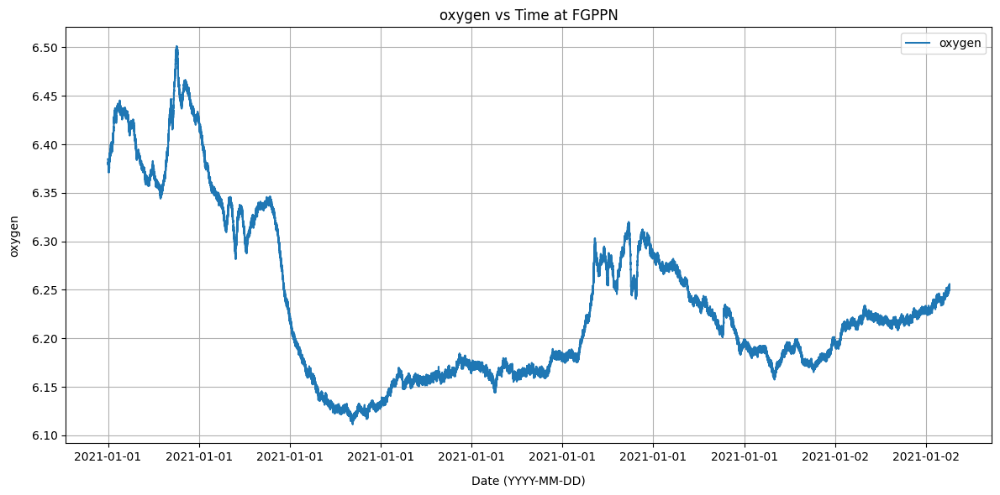

In [97]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Create figure
plt.figure(figsize=(12, 6))

# Plot time vs. value
plt.plot(prop_df["time"], prop_df["value"], label=chosen_property)

# Set title and labels
plt.title(f"{chosen_property} vs Time at {locationCode}")
plt.xlabel("Date (YYYY-MM-DD)", labelpad=10)
plt.ylabel(chosen_property, labelpad=10)

# Format x-axis dates according to ISO format: YYYY-MM-DD
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m-%d"))

# Add grid, legend, and layout fixes
plt.grid(True)
plt.legend()
plt.tight_layout()

# Show plot
plt.show()

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=1cd2cd01-70e8-41b6-af2d-f797c6675dbe' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>